## Creating an interactive my of community plan areas with high pedestrian injury/death

In [1]:
# data
import pandas as pd
import geopandas as gpd

# graphics
import contextily as ctx
import matplotlib.pyplot as plt
import plotly.express as px

# stats
import libpysal as lps

/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


In [2]:
# import data
crash = pd.read_csv('Ped_Crashes.csv')

In [3]:
# checking data to find columns i need
crash.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3294 entries, 0 to 3293
Data columns (total 80 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   CASE_ID                  3294 non-null   int64  
 1   ACCIDENT_YEAR            3294 non-null   int64  
 2   PROC_DATE                3294 non-null   object 
 3   JURIS                    3294 non-null   int64  
 4   COLLISION_DATE           3294 non-null   object 
 5   COLLISION_TIME           3294 non-null   int64  
 6   OFFICER_ID               3292 non-null   object 
 7   REPORTING_DISTRICT       3183 non-null   object 
 8   DAY_OF_WEEK              3294 non-null   int64  
 9   CHP_SHIFT                3294 non-null   int64  
 10  POPULATION               3294 non-null   int64  
 11  CNTY_CITY_LOC            3294 non-null   int64  
 12  SPECIAL_COND             3294 non-null   int64  
 13  BEAT_TYPE                3294 non-null   int64  
 14  CHP_BEAT_TYPE           

/tmp/ipykernel_1563/2714541227.py:2: FutureWarning: null_counts is deprecated. Use show_counts instead
  crash.info(verbose=True, null_counts=True)


In [4]:
# subsetting data
sub = ['POINT_X', 'POINT_Y']

In [5]:
crash[sub]

,POINT_X,POINT_Y
0,-118.432350,34.179401
1,-118.297913,34.052650
2,-118.235374,33.934288
3,-118.425797,34.190311
4,-118.285667,34.063709
...,...,...
3289,-118.440773,34.265511
3290,-118.391663,34.154354
3291,-118.243950,33.960152
3292,-118.385994,34.226543


In [6]:
# to illustrate, bring in tracts
gdf_tracts = gpd.read_file('tracts.geojson')

In [7]:
# population block group data from census reporter
gdf_bg = gpd.read_file('acs2019_5yr_B01003_15000US060372672002.geojson')

<AxesSubplot:>

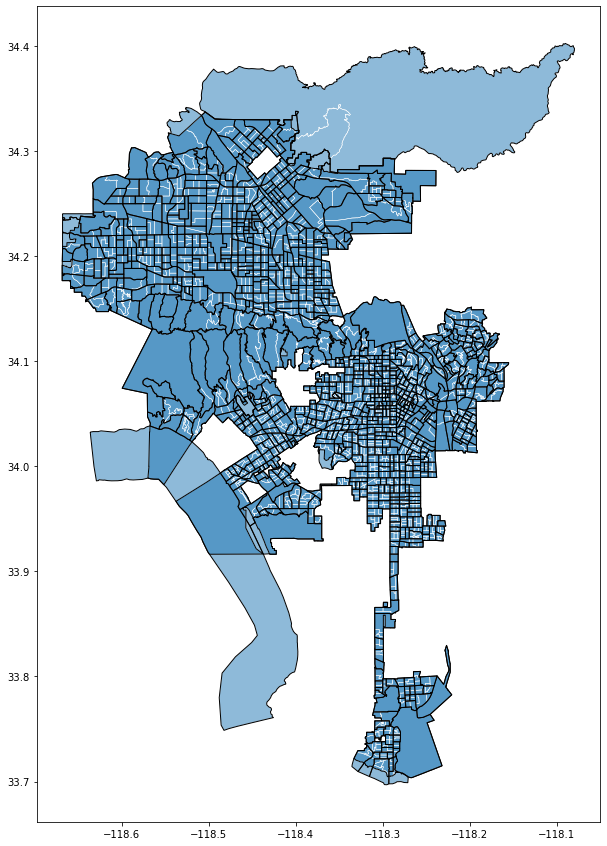

In [8]:
# compare
fig,ax = plt.subplots(figsize=(15,15))

# blue background of census tracts
gdf_tracts.plot(ax=ax,zorder=10,alpha=0.5)

# while lines to show block groups (sandwiched between the two layers above for visual clarity)
gdf_bg.boundary.plot(ax=ax,color='white',zorder=15,lw=0.5)

# black boundary lines of census tracts on top of everything
gdf_tracts.boundary.plot(ax=ax,color='black',zorder=20,lw=1)

In [9]:
# get the total bounds
minx,miny,maxx,maxy = gdf_bg.total_bounds

In [10]:
gdf_bg.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2516 entries, 0 to 2515
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   geoid             2516 non-null   object  
 1   name              2516 non-null   object  
 2   B01003001         2516 non-null   float64 
 3   B01003001, Error  2516 non-null   float64 
 4   geometry          2516 non-null   geometry
dtypes: float64(2), geometry(1), object(2)
memory usage: 98.4+ KB


In [11]:
# trim the data to the bare minimum columns
gdf_bg = gdf_bg[['geoid','B01003001','geometry']]

# rename the columns
gdf_bg.columns = ['FIPS','TotalPop','geometry']

In [12]:
# delete last row which is for the entire city of LA
gdf_bg=gdf_bg.drop(2515)

In [13]:
# fix FIPS code
gdf_bg['FIPS'] = gdf_bg['FIPS'].str.replace('15000US','')
gdf_bg.tail()

,FIPS,TotalPop,geometry
2510,060379800241,223.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184..."
2511,060379800261,26.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
2512,060379800281,0.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
2513,060379800311,1175.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
2514,060379902000,0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."


In [14]:
# sort by total pop
gdf_bg.sort_values(by='TotalPop').head(20)

,FIPS,TotalPop,geometry
2514,060379902000,0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."
2358,060372772002,0.0,"MULTIPOLYGON (((-118.38597 33.94734, -118.3859..."
2512,060379800281,0.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
2509,060379800231,0.0,"MULTIPOLYGON (((-118.64870 34.23120, -118.6480..."
2506,060379800201,0.0,"MULTIPOLYGON (((-118.34412 34.21700, -118.3438..."
2508,060379800221,0.0,"MULTIPOLYGON (((-118.50266 34.30809, -118.5026..."
2501,060379800091,5.0,"MULTIPOLYGON (((-118.33707 34.14160, -118.3361..."
2503,060379800141,9.0,"MULTIPOLYGON (((-118.26088 33.76850, -118.2602..."
2511,060379800261,26.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
2507,060379800211,33.0,"MULTIPOLYGON (((-118.40183 34.26509, -118.4017..."


In [15]:
# delete less than 100 population geographies
gdf_bg = gdf_bg[gdf_bg['TotalPop']>100]

In [16]:
# get the layers into a web mercator projection
# reproject to web mercator
gdf_bg = gdf_bg.to_crs(epsg=3857)

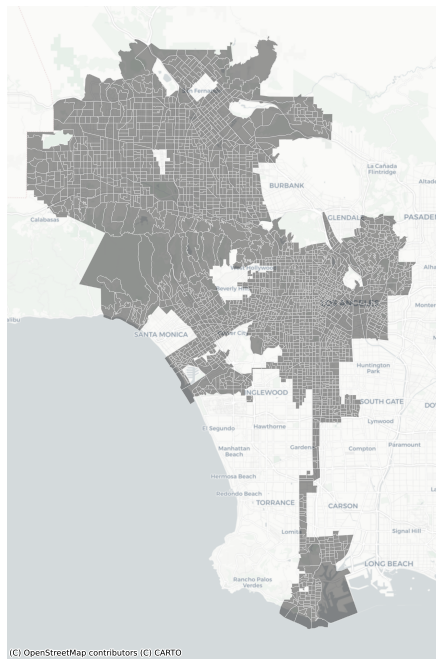

In [17]:
# plot it!
fig, ax = plt.subplots(figsize=(12,12))

gdf_bg.plot(ax=ax,
         color='black', 
         edgecolor='white',
         lw=0.5,
         alpha=0.4)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [18]:
df = pd.read_csv('Ped_Crashes.csv')

In [19]:
sub = ['POINT_X', 'POINT_Y']

In [20]:
crash = df[sub].copy()

In [21]:
crashes = gpd.GeoDataFrame(crash,
                              crs='EPSG:4326',
                              geometry=gpd.points_from_xy(crash.POINT_X, crash.POINT_Y))

In [22]:
# get the layers into a web mercator projection
# reproject to web mercator
crashes = crashes.to_crs(epsg=3857)

In [23]:
# convert lat/lon to floats
crashes.POINT_X = crashes.POINT_X.astype('float')
crashes.POINT_Y = crashes.POINT_Y.astype('float')

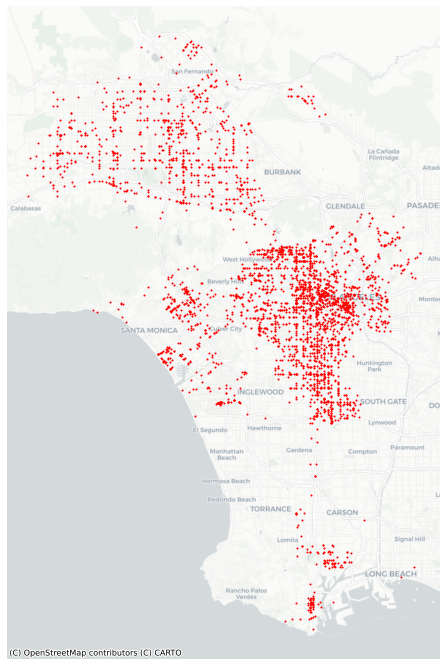

In [24]:
# map it!
fig,ax = plt.subplots(figsize=(12,12))

crashes.plot(ax=ax,
             color='red',
             markersize=1)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)


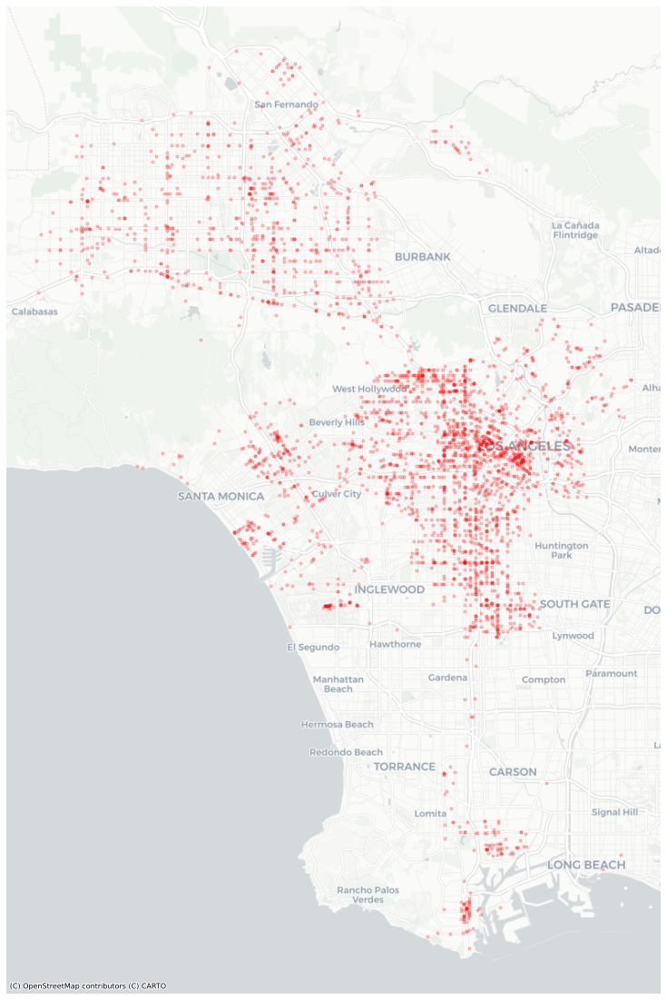

In [25]:
# map it!
fig,ax = plt.subplots(figsize=(20,20))

crashes.plot(ax=ax,
             color='red',
             markersize=10, alpha=0.2)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)


In [26]:
# get the bounding box coordinates for the arrest data
minx, miny, maxx, maxy = crashes.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-13207278.094793463
-13152978.079199988
3990141.016783523
4072032.002685393


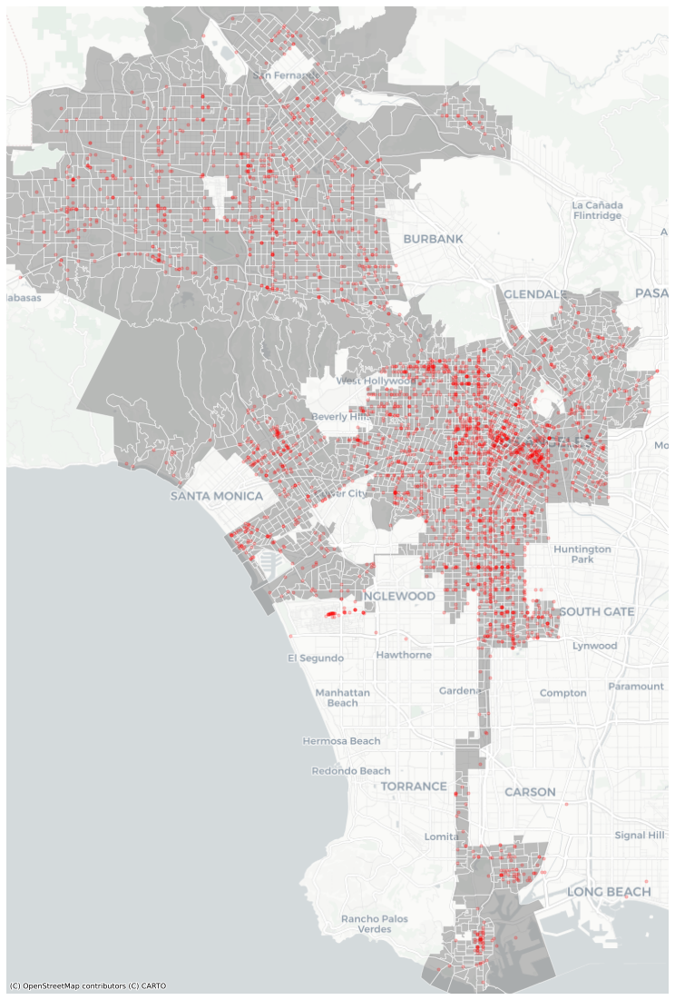

In [27]:
# set up the plot canvas with plt.subplots
fig, ax = plt.subplots(figsize=(20, 20))

# block groups
gdf_bg.plot(ax=ax, # this puts it in the ax plot
        color='gray', 
        edgecolor='white',
        alpha=0.5)

# crashes
crashes.plot(ax=ax, # this also puts it in the same ax plot
            color='red',
            markersize=10,
            alpha=0.2)

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx - 1000, maxx + 1000) # added/substracted value is to give some margin around total bounds
ax.set_ylim(miny - 1000, maxy + 1000)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [28]:
# Do the spatial join
join = gpd.sjoin(crashes, gdf_bg, how='left')
join.head()

,POINT_X,POINT_Y,geometry,index_right,FIPS,TotalPop
0,-118.432350,34.179401,POINT (-13183828.913 4052916.764),573.0,060371286011,3175.0
1,-118.297913,34.052650,POINT (-13168863.392 4035873.888),1455.0,060372133102,1691.0
2,-118.235374,33.934288,POINT (-13161901.678 4019981.923),2055.0,060372431001,3170.0
3,-118.425797,34.190311,POINT (-13183099.364 4054384.918),431.0,060371235102,1866.0
4,-118.285667,34.063709,POINT (-13167500.265 4037359.834),1373.0,060372111202,2953.0


In [29]:
crashes_by_bg = join.FIPS.value_counts().rename_axis('FIPS').reset_index(name='crash_count')

In [30]:
crashes_by_bg.head()

,FIPS,crash_count
0,060372077101,29
1,060372260021,21
2,060372073012,13
3,060372063002,12
4,060372074001,12


In [31]:
# join the summary table back to the gdf
gdf_bg=gdf_bg.merge(crashes_by_bg,on='FIPS')

In [32]:
# our neighborhood table now has a count column
gdf_bg.sample(10)

,FIPS,TotalPop,geometry,crash_count
1021,060372346001,1134.0,"MULTIPOLYGON (((-13171724.348 4027885.229, -13...",2
1214,060372672003,1059.0,"MULTIPOLYGON (((-13185352.525 4035133.937, -13...",4
483,060371905101,2689.0,"MULTIPOLYGON (((-13170371.816 4042468.594, -13...",3
1296,060372742021,1848.0,"MULTIPOLYGON (((-13187401.361 4026175.093, -13...",1
130,060371175201,4168.0,"MULTIPOLYGON (((-13187756.136 4059929.071, -13...",3
840,060372182103,1124.0,"MULTIPOLYGON (((-13173951.740 4034233.558, -13...",1
935,060372267001,2066.0,"MULTIPOLYGON (((-13164804.283 4030645.644, -13...",1
279,060371284004,1274.0,"MULTIPOLYGON (((-13188443.200 4053750.612, -13...",1
713,060372094031,2150.0,"MULTIPOLYGON (((-13166261.901 4036247.486, -13...",2
802,060372146001,839.0,"MULTIPOLYGON (((-13176425.481 4039022.964, -13...",2


In [33]:
gdf_bg['crashes_per_1000'] = gdf_bg['crash_count']/gdf_bg['TotalPop']*1000

In [34]:
gdf_bg.sort_values(by="crashes_per_1000").tail()

,FIPS,TotalPop,geometry,crash_count,crashes_per_1000
1284,060372735022,386.0,"MULTIPOLYGON (((-13189115.569 4026857.882, -13...",5,12.953368
1368,060372966002,608.0,"MULTIPOLYGON (((-13168242.942 3993414.950, -13...",8,13.157895
931,060372260021,1453.0,"MULTIPOLYGON (((-13164628.510 4033003.746, -13...",21,14.452856
1382,060379800241,223.0,"MULTIPOLYGON (((-13193418.068 4053521.172, -13...",5,22.421525
932,060372260022,367.0,"MULTIPOLYGON (((-13163200.169 4033417.877, -13...",11,29.972752


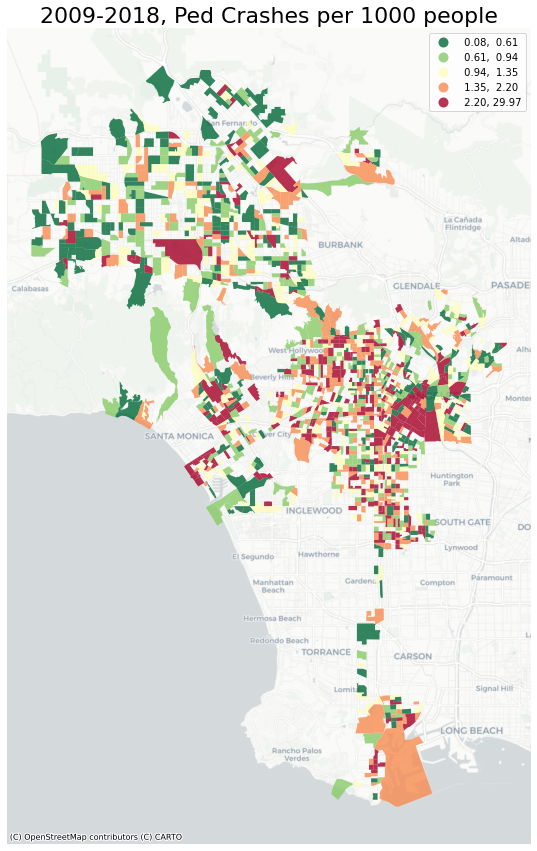

In [35]:
fig,ax = plt.subplots(figsize=(15,15))

gdf_bg.plot(ax=ax,
        column='crashes_per_1000',
        legend=True,
        alpha=0.8,
        cmap='RdYlGn_r',
        scheme='quantiles')

ax.axis('off')
ax.set_title('2009-2018, Ped Crashes per 1000 people',fontsize=22)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [36]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(gdf_bg,k=8)

# Row-standardization
wq.transform = 'r'

In [37]:
# create a new column for the spatial lag
gdf_bg['crashes_per_1000_lag'] = lps.weights.lag_spatial(wq, gdf_bg['crashes_per_1000'])

In [38]:
# create a column that calculates the difference betwen crashes and lag
gdf_bg['crash_lag_diff'] = gdf_bg['crashes_per_1000'] - gdf_bg['crashes_per_1000_lag']

In [39]:
# output to get the head and tail
gdf_bg.sort_values(by='crash_lag_diff')

,FIPS,TotalPop,geometry,crash_count,crashes_per_1000,crashes_per_1000_lag,crash_lag_diff
930,060372260012,1103.0,"MULTIPOLYGON (((-13163996.660 4032161.962, -13...",5,4.533092,7.985773,-3.452682
798,060372144002,1082.0,"MULTIPOLYGON (((-13175709.697 4039576.017, -13...",1,0.924214,4.353723,-3.429508
355,060371390011,1621.0,"MULTIPOLYGON (((-13192453.484 4052500.119, -13...",1,0.616903,4.015562,-3.398659
1375,060372972011,3092.0,"MULTIPOLYGON (((-13168494.190 3991959.036, -13...",1,0.323415,3.355568,-3.032153
793,060372140003,1134.0,"MULTIPOLYGON (((-13174511.009 4039582.468, -13...",1,0.881834,3.849330,-2.967495
...,...,...,...,...,...,...,...
1284,060372735022,386.0,"MULTIPOLYGON (((-13189115.569 4026857.882, -13...",5,12.953368,2.952789,10.000579
1368,060372966002,608.0,"MULTIPOLYGON (((-13168242.942 3993414.950, -13...",8,13.157895,2.788735,10.369160
800,060372145012,395.0,"MULTIPOLYGON (((-13175934.117 4039025.517, -13...",5,12.658228,2.160359,10.497869
1382,060379800241,223.0,"MULTIPOLYGON (((-13193418.068 4053521.172, -13...",5,22.421525,1.262021,21.159504


In [40]:
# set the mapbox access token
token = 'pk.eyJ1IjoieW9obWFuIiwiYSI6IkxuRThfNFkifQ.u2xRJMiChx914U7mOZMiZw'
px.set_mapbox_access_token(token)

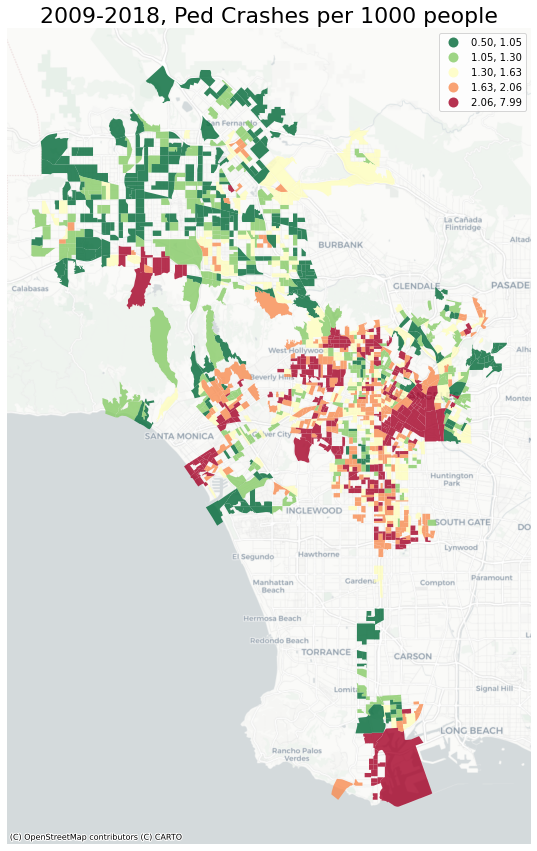

In [41]:
# use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
gdf_bg.plot(ax=ax,
         figsize=(15,15),
         column='crashes_per_1000_lag',
         legend=True,
         alpha=0.8,
         cmap='RdYlGn_r',
         scheme='quantiles')

ax.axis('off')
ax.set_title('2009-2018, Ped Crashes per 1000 people',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [42]:
# interactive version needs to be in WGS84
gdf_web = gdf_bg.to_crs('EPSG:4326')

In [43]:
# what's the centroid?
minx, miny, maxx, maxy = gdf_web.geometry.total_bounds
center_lat_gdf_web = (maxy-miny)/2+miny
center_lon_gdf_web = (maxx-minx)/2+minx

In [44]:
# some stats
gdf_web.crashes_per_1000_lag.describe()

count    1384.000000
mean        1.603519
std         0.725714
min         0.495755
25%         1.114815
50%         1.451248
75%         1.915758
max         7.985773
Name: crashes_per_1000_lag, dtype: float64

In [45]:
# grab the median
median = gdf_web.crashes_per_1000_lag.median()

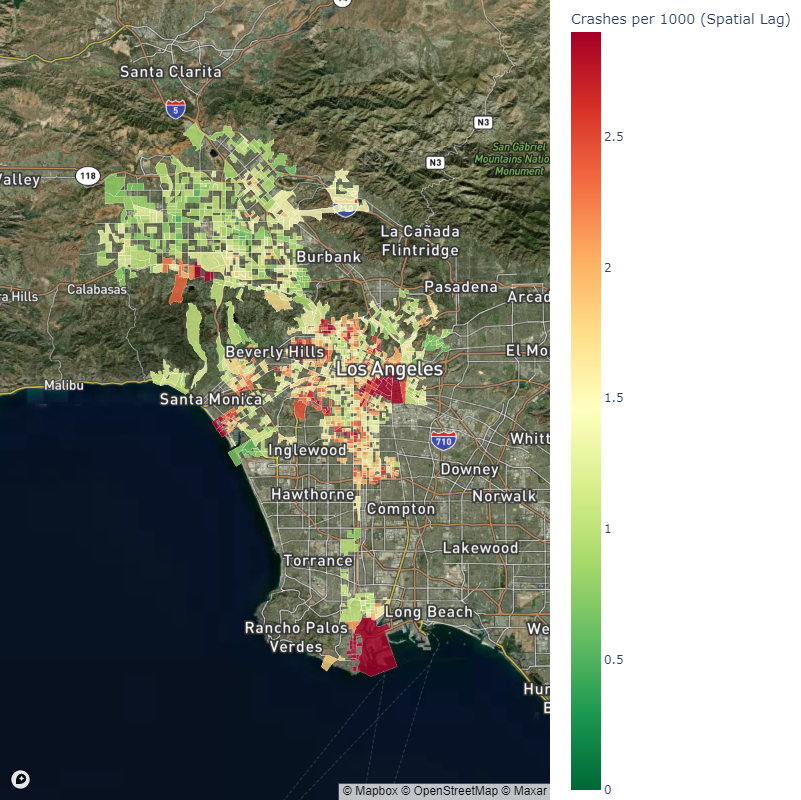

In [46]:
fig = px.choropleth_mapbox(gdf_web, 
                     geojson=gdf_web.geometry, # the geometry column
                     locations=gdf_web.index, # the index
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     color='crashes_per_1000_lag',
                     color_continuous_scale='RdYlGn_r',
                     color_continuous_midpoint =median, # put the median as the midpoint
                     range_color =(0,median*2),
                     hover_data=['FIPS','TotalPop','crash_count','crashes_per_1000','crashes_per_1000_lag'],
                     center = {"lat": center_lat_gdf_web, "lon": center_lon_gdf_web},
                     opacity=0.8,
                     width=1000,
                     height=800,
                     labels={
                             'crashes_per_1000_lag':'Crashes per 1000 (Spatial Lag)',
                             'crashes_per_1000':'Crashes per 1000',
                     })
fig.update_traces(marker_line_width=0.1, marker_line_color='white')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

In [47]:
fig.write_html("pedcollisions.html")